<a href="https://colab.research.google.com/github/lovekittynine/Annotated-DDPM/blob/master/ConditionalDDPM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 条件ddpm数字生成

In [ ]:
!pip3 install -q diffusers transformers accelerate datasets wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 47.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.2/251.2 kB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.3/519.3 kB 36.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 81.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 18.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 70.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 106.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.5/188.5 kB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

100%|██████████| 26421880/26421880 [00:00<00:00, 108868727.48it/s]


Extracting ./fashion_minist/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./fashion_minist/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 4659197.69it/s]

Extracting ./fashion_minist/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./fashion_minist/FashionMNIST/raw




100%|██████████| 4422102/4422102 [00:00<00:00, 62573428.07it/s]


Extracting ./fashion_minist/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./fashion_minist/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 16686458.26it/s]


Extracting ./fashion_minist/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./fashion_minist/FashionMNIST/raw

torch.Size([128, 1, 28, 28]) torch.Size([128])
labels: tensor([0, 3, 6, 7, 8, 8, 0, 5])


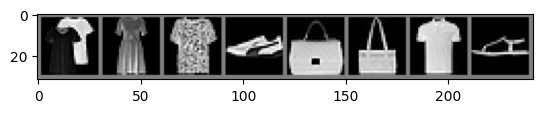

In [ ]:
import torch
from torch import optim, nn
import torchvision
import torch.nn.functional as F
from diffusers import DDPMPipeline, DDIMScheduler, UNet2DModel
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from PIL import Image


transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.5], [0.5])
])

dataset = torchvision.datasets.FashionMNIST(root="./fashion_minist", transform=transforms, download=True)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=2, pin_memory=True)

xs, ys = next(iter(dataloader))
print(xs.shape, ys.shape)

# show some demo images
grid = torchvision.utils.make_grid(xs[:8]).cpu().permute([1,2,0]) * 0.5 + 0.5
plt.imshow(grid)
print(f"labels: {ys[:8]}")

In [ ]:
import numpy as np

def show_images(images):
  # normalize to 0-1
  grid = torchvision.utils.make_grid(images, nrow=8).detach().cpu().permute([1, 2, 0]) * 0.5 + 0.5
  # to pil image
  grid = Image.fromarray((grid.numpy()*255).astype(np.uint8))
  return grid

In [ ]:
class ConditionalFashionUNet2D(nn.Module):
  """
  条件fashion unet模型
  """
  def __init__(self, in_channels=1, out_channels=1, num_classes=10, class_embed_dim=4):
    super().__init__()
    # 类别嵌入
    self.class_embedding = nn.Embedding(num_classes, class_embed_dim)
    # unet 模型
    self.unet = UNet2DModel(
        sample_size=28,
        in_channels=in_channels + class_embed_dim,
        out_channels=out_channels,
        layers_per_block=2,
        down_block_types=["DownBlock2D", "AttnDownBlock2D", "AttnDownBlock2D"],
        up_block_types=["AttnUpBlock2D", "AttnUpBlock2D", "UpBlock2D"],
        block_out_channels=[32, 64, 128]
        )

  def forward(self, xs, t, ys):
    class_embed = self.class_embedding(ys)
    bs, c, h, w = xs.shape
    class_embed = class_embed.unsqueeze(-1).unsqueeze(-1).repeat([1, 1, h, w])
    # 类别条件作为额外的输入通道
    xs = torch.cat([xs, class_embed], dim=1)
    noise = self.unet(xs, t).sample
    return noise


if __name__ == "__main__":
  xs = torch.randn([16,1,28,28])
  ys = torch.randint(0, 10, (16,))
  timesteps = torch.randint(0, 1000, (16,))
  model = ConditionalFashionUNet2D()
  noise = model(xs, timesteps, ys)
  print(noise.shape)

torch.Size([16, 1, 28, 28])


In [ ]:
!wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


wandb: Currently logged in as: lovekittynone. Use `wandb login --relogin` to force relogin


training...:   0%|          | 0/50 [00:00<?, ?it/s]

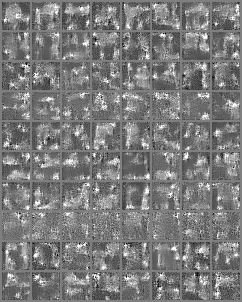

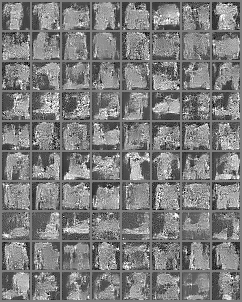

Epoch:[01] - Loss:0.049


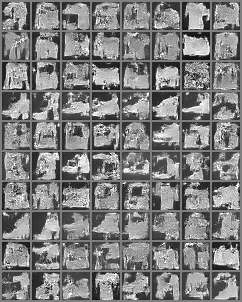

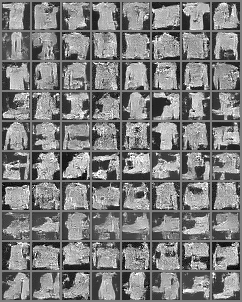

Epoch:[01] - Loss:0.049


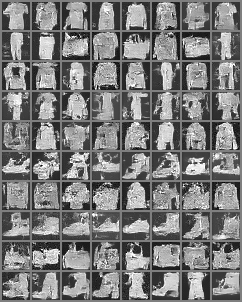

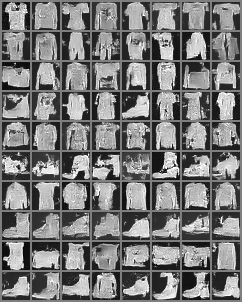

Epoch:[02] - Loss:0.039


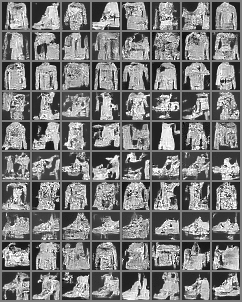

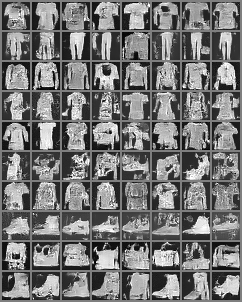

Epoch:[02] - Loss:0.045


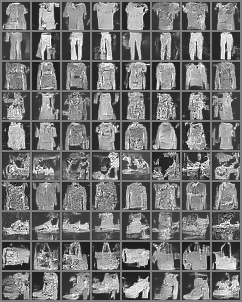

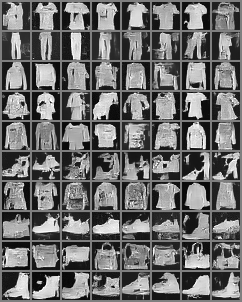

Epoch:[03] - Loss:0.036


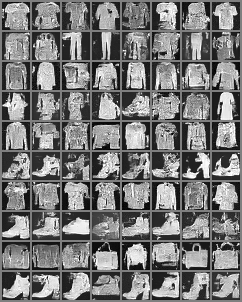

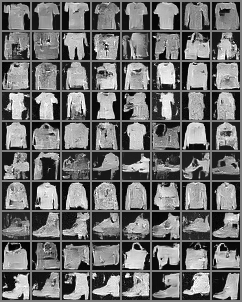

Epoch:[03] - Loss:0.035


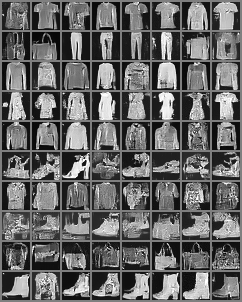

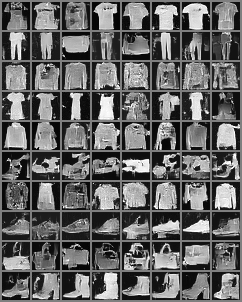

Epoch:[04] - Loss:0.030


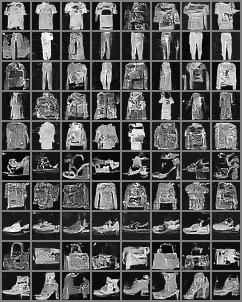

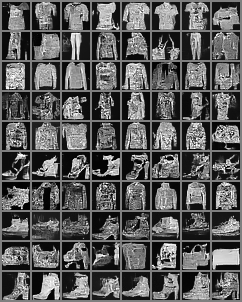

Epoch:[04] - Loss:0.029


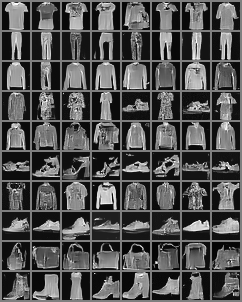

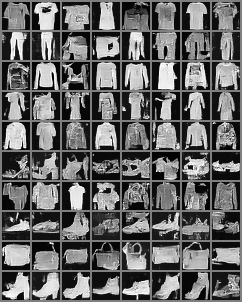

Epoch:[05] - Loss:0.047


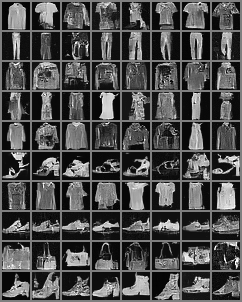

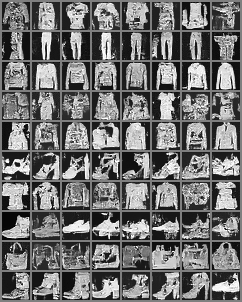

Epoch:[05] - Loss:0.047


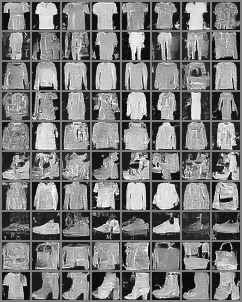

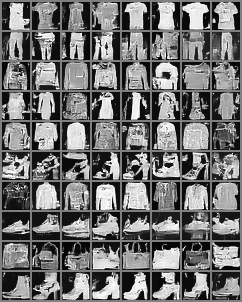

Epoch:[06] - Loss:0.033


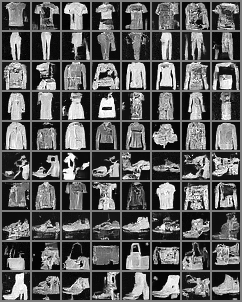

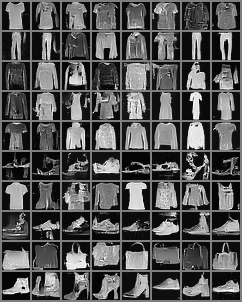

Epoch:[06] - Loss:0.041


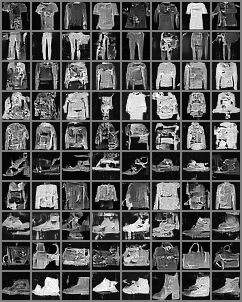

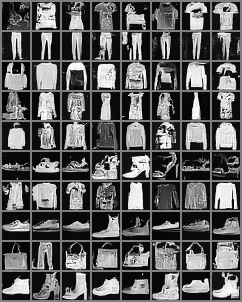

Epoch:[07] - Loss:0.048


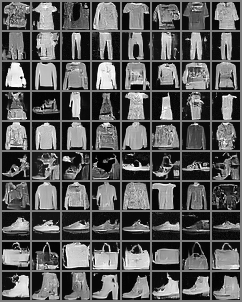

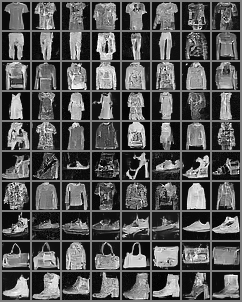

Epoch:[07] - Loss:0.040


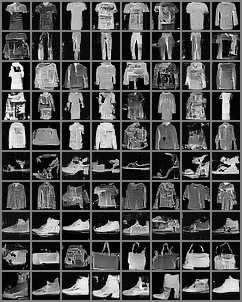

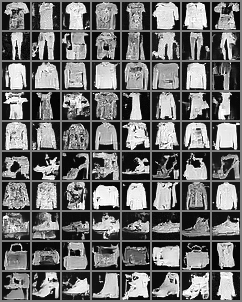

Epoch:[08] - Loss:0.045


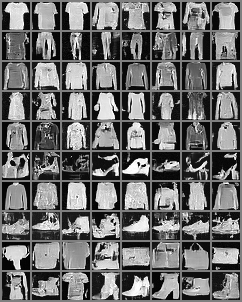

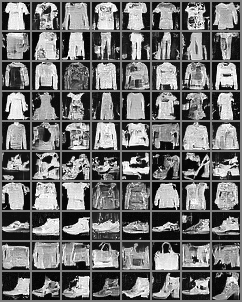

Epoch:[08] - Loss:0.037


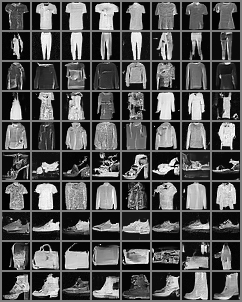

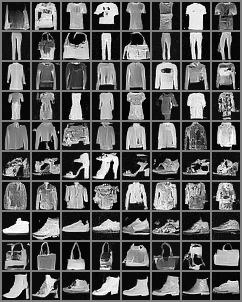

Epoch:[09] - Loss:0.033


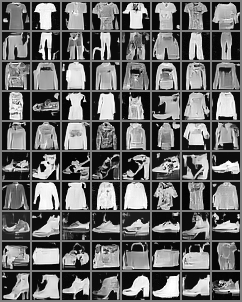

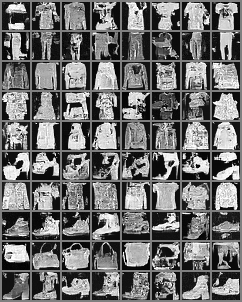

Epoch:[09] - Loss:0.038


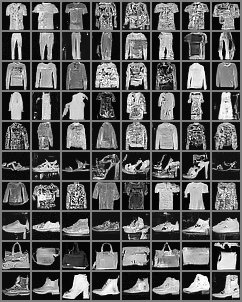

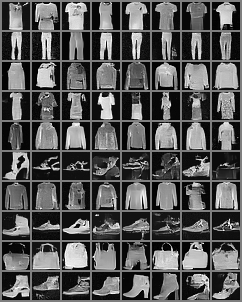

Epoch:[10] - Loss:0.034


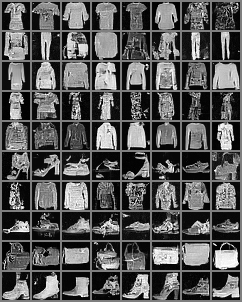

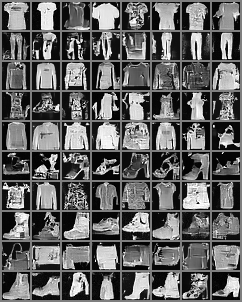

Epoch:[10] - Loss:0.032


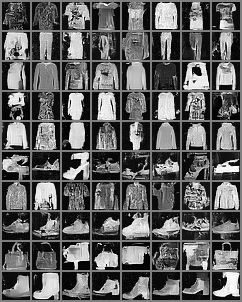

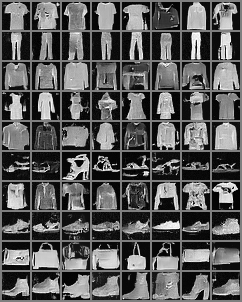

Epoch:[11] - Loss:0.030


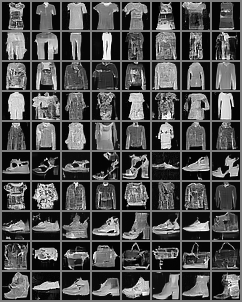

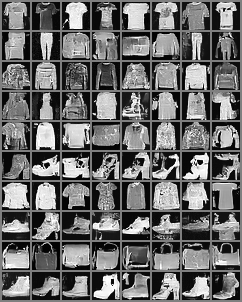

Epoch:[11] - Loss:0.040


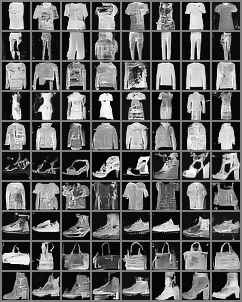

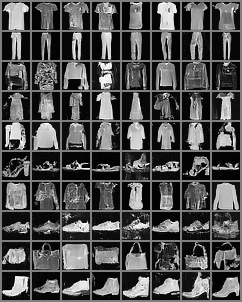

Epoch:[12] - Loss:0.041


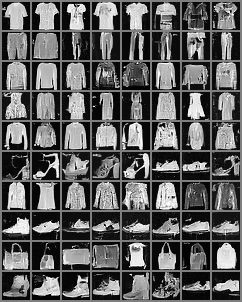

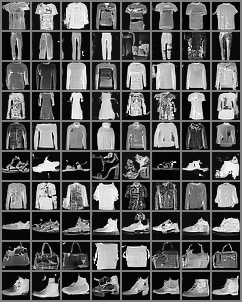

Epoch:[12] - Loss:0.034


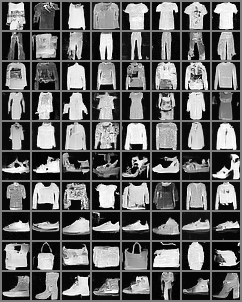

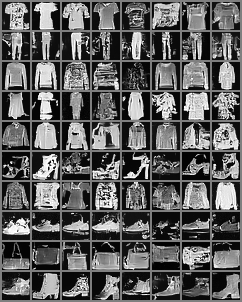

Epoch:[13] - Loss:0.048


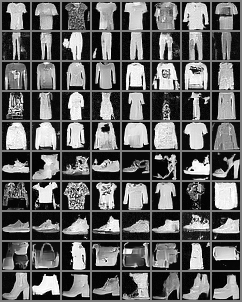

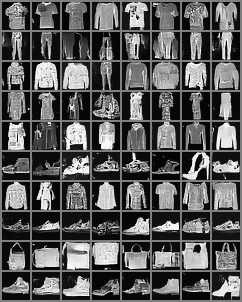

Epoch:[13] - Loss:0.041


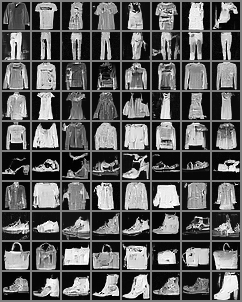

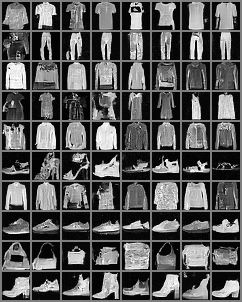

Epoch:[14] - Loss:0.042


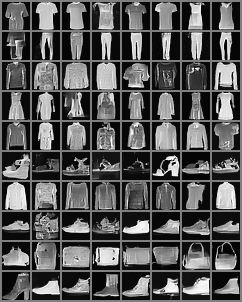

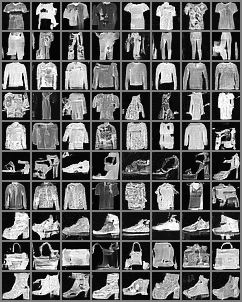

Epoch:[14] - Loss:0.030


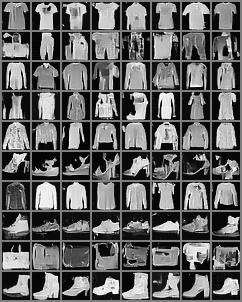

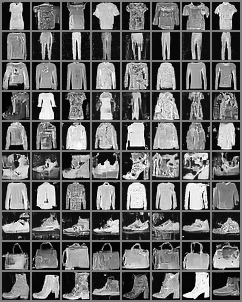

Epoch:[15] - Loss:0.043


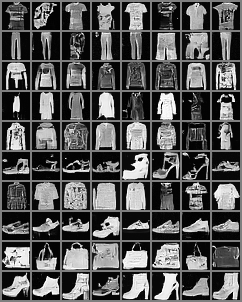

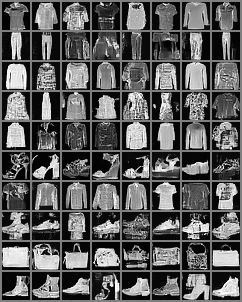

Epoch:[15] - Loss:0.036


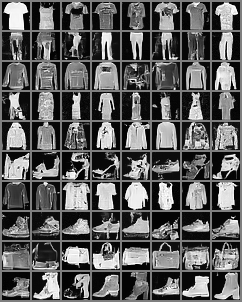

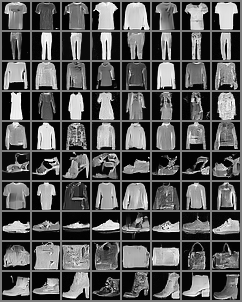

Epoch:[16] - Loss:0.031


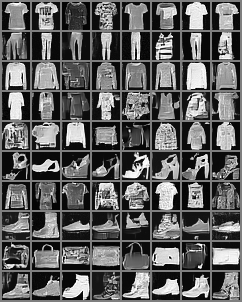

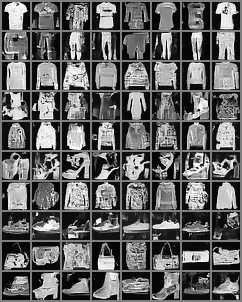

Epoch:[16] - Loss:0.034


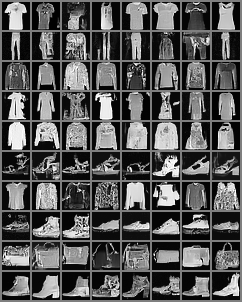

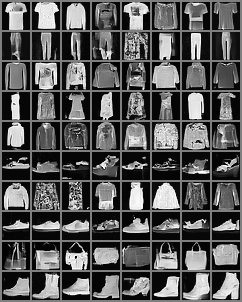

Epoch:[17] - Loss:0.033


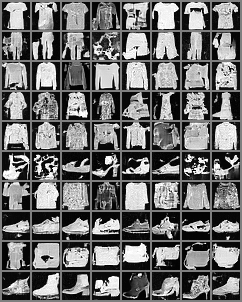

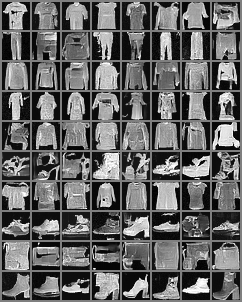

Epoch:[17] - Loss:0.039


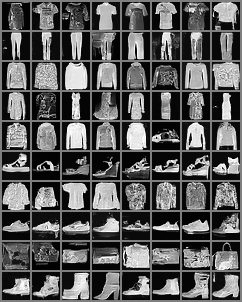

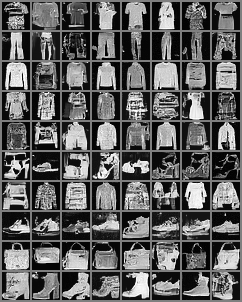

Epoch:[18] - Loss:0.028


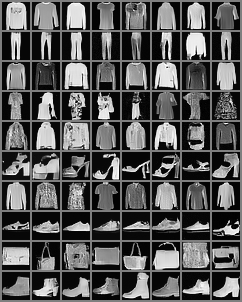

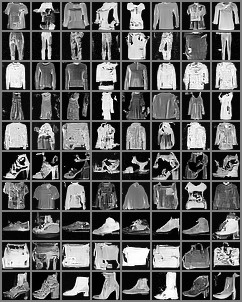

Epoch:[18] - Loss:0.040


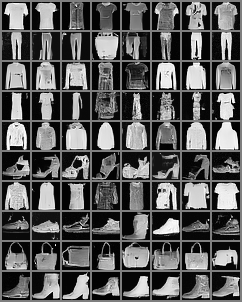

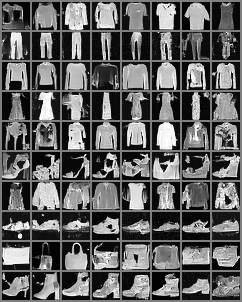

Epoch:[19] - Loss:0.043


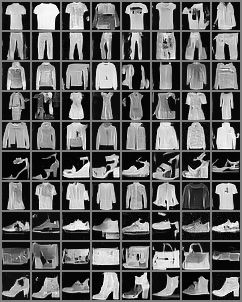

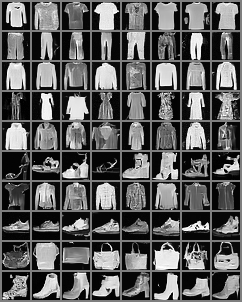

Epoch:[19] - Loss:0.037


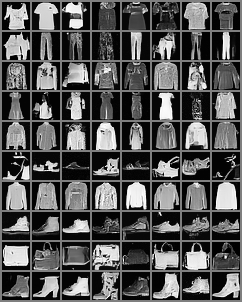

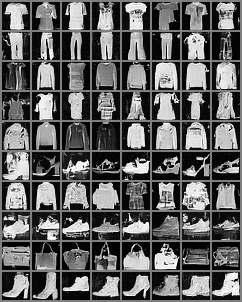

Epoch:[20] - Loss:0.038


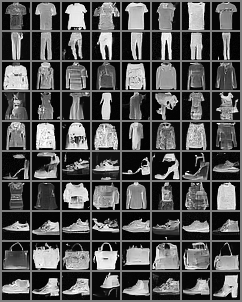

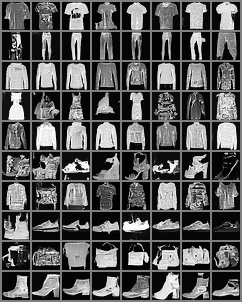

Epoch:[20] - Loss:0.030


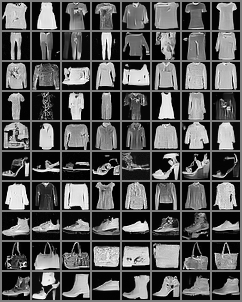

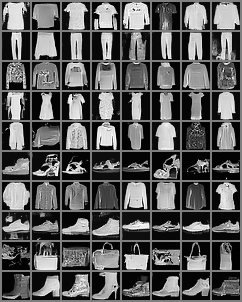

Epoch:[21] - Loss:0.036


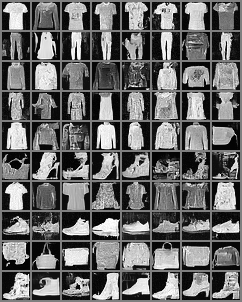

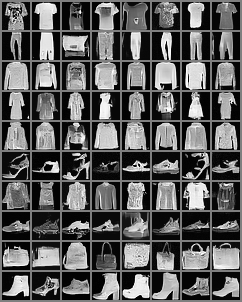

Epoch:[21] - Loss:0.033


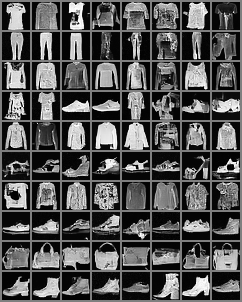

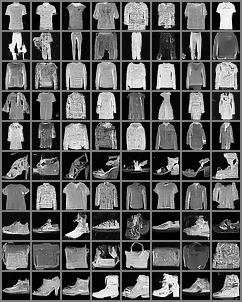

Epoch:[22] - Loss:0.032


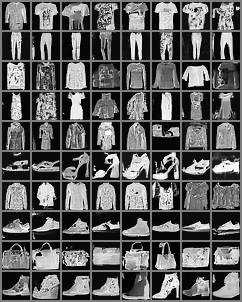

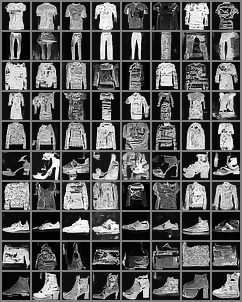

Epoch:[22] - Loss:0.033


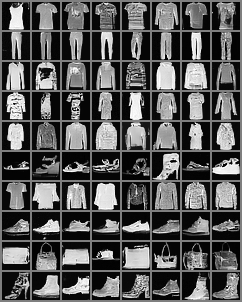

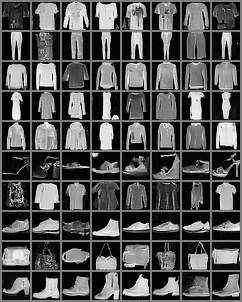

Epoch:[23] - Loss:0.035


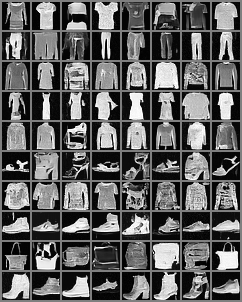

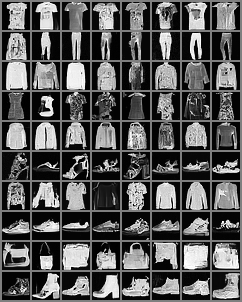

Epoch:[23] - Loss:0.034


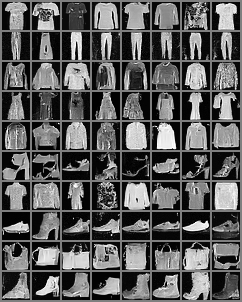

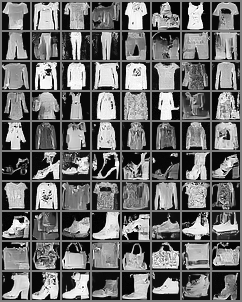

Epoch:[24] - Loss:0.033


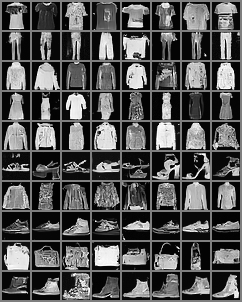

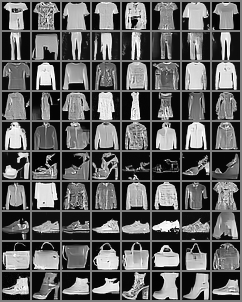

Epoch:[24] - Loss:0.028


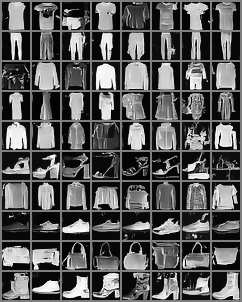

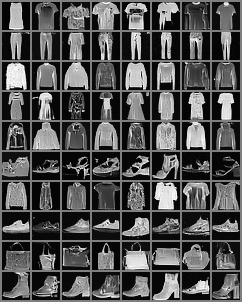

Epoch:[25] - Loss:0.037


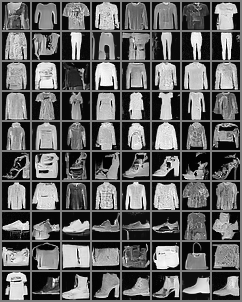

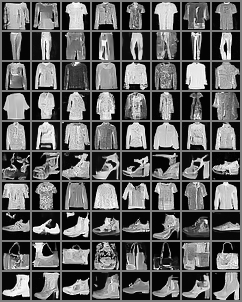

Epoch:[25] - Loss:0.032


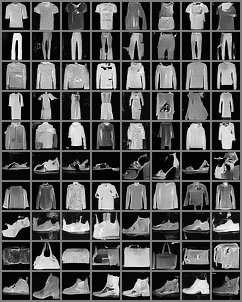

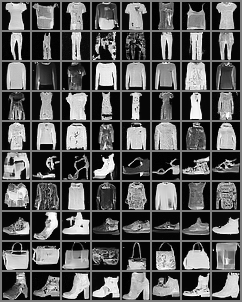

Epoch:[26] - Loss:0.049


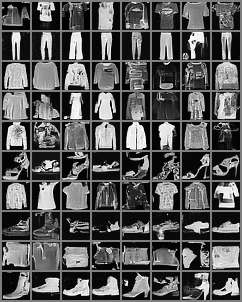

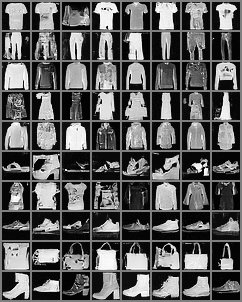

Epoch:[26] - Loss:0.045


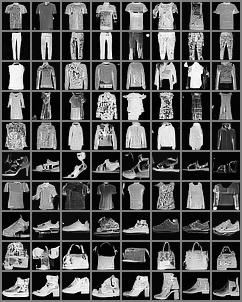

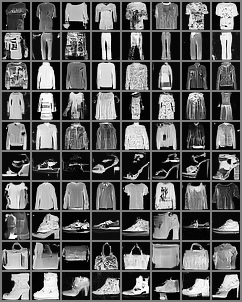

Epoch:[27] - Loss:0.049


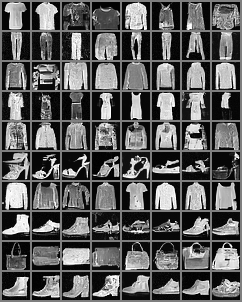

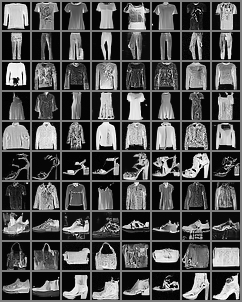

Epoch:[27] - Loss:0.034


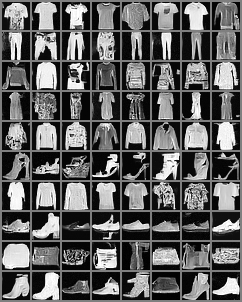

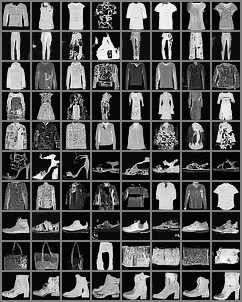

Epoch:[28] - Loss:0.030


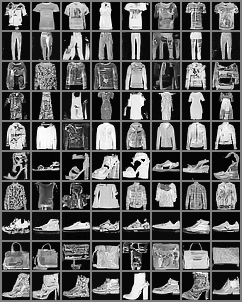

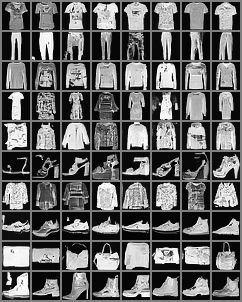

Epoch:[28] - Loss:0.029


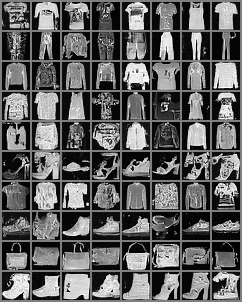

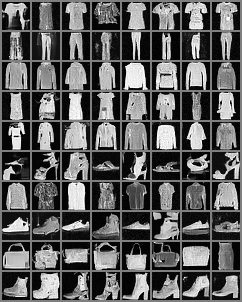

Epoch:[29] - Loss:0.028


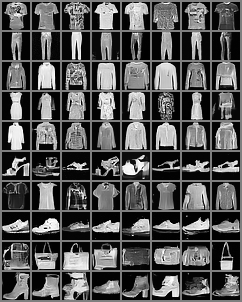

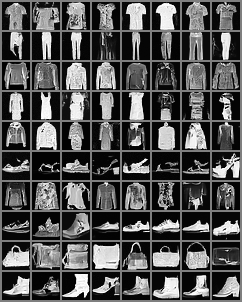

Epoch:[29] - Loss:0.028


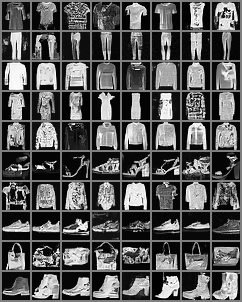

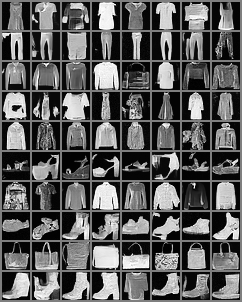

Epoch:[30] - Loss:0.028


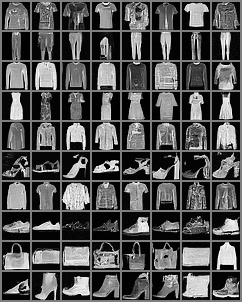

In [ ]:
from tqdm.auto import tqdm
import wandb

epochs = 50
optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
lr_scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
noise_scheduler = DDIMScheduler()
noise_scheduler.set_timesteps(50)

model = model.to(device)
model.train()

# initial wanbd
wandb.init(project="conditional_ddpm", name="third", config={"init_lr":1e-3, "weight_decay":1e-4})


for epoch in tqdm(range(epochs), desc="training..."):
  cnt = 1
  for xs, ys in dataloader:
    xs = xs.to(device, non_blocking=True)
    ys = ys.to(device, non_blocking=True)
    # random noise
    noise = torch.randn_like(xs)
    # random time step
    timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (xs.size(0),)).to(device, non_blocking=True)
    # add noise
    noise_xs = noise_scheduler.add_noise(xs, noise, timesteps)

    # forward
    noise_pred = model(noise_xs, timesteps, ys)
    loss = F.mse_loss(noise_pred, noise)
    cnt += 1

    wandb.log({"loss":loss.item()})

    # backward
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()

    if cnt % 100 == 0:
      # show some predict
      samples = torch.randn((80, 1, 28, 28)).to(device, non_blocking=True)
      labels = torch.tensor([[i] * 8 for i in range(10)]).flatten().to(device, non_blocking=True)
      for t in noise_scheduler.timesteps:
        with torch.inference_mode():
          residual = model(samples, t, labels)
        samples = noise_scheduler.step(residual, t, samples).prev_sample
      im = show_images(samples)
      wandb.log({"images": wandb.Image(im)})
      display(im)



    if cnt % 200 == 0:
      print(f"Epoch:[{epoch+1:02d}] - Loss:{loss.item():.3f}")
  # save model
  torch.save(model.state_dict(), f"./epoch-{epoch+1}.pt")



